<a href="https://colab.research.google.com/github/SAMashiyane/Residual_CNN_Explanation/blob/main/BottleNeck_Residual.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***BottleNeck Residual Blocks***

# **reference**:
[MobileNetV2: Inverted Residuals and Linear Bottlenecks
](https://arxiv.org/abs/1801.04381)

In [1]:
!nvidia-smi 

Wed Mar 30 18:17:20 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **reference**:
[MobileNetV2: Inverted Residuals and Linear Bottlenecks
](https://arxiv.org/abs/1801.04381)

In [2]:
!nvidia-smi 

Wed Mar 30 18:17:20 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import glob
import cv2
import shutil
from PIL import Image
from torch import nn
from torch import Tensor
from typing import Optional

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader,Dataset
from torchvision.models import resnet18, resnet34 ,resnet50
import os
import torchvision.models as models

device = 'cuda' if torch.cuda.is_available() else 'cpu'
best_acc = 0  # best test accuracy
start_epoch = 0  # start from epoch 0 or last checkpoint epoch
use_gpu = torch.cuda.is_available()

use_gpu

True

# **BottleNeck Residual Blocks**

A Bottleneck Residual Block is a variant of the residual block that utilises 1x1 convolutions to create a bottleneck. The use of a bottleneck reduces the number of parameters and matrix multiplications. The idea is to make residual blocks as thin as possible to increase depth and have less parameters.
r---> reduction 

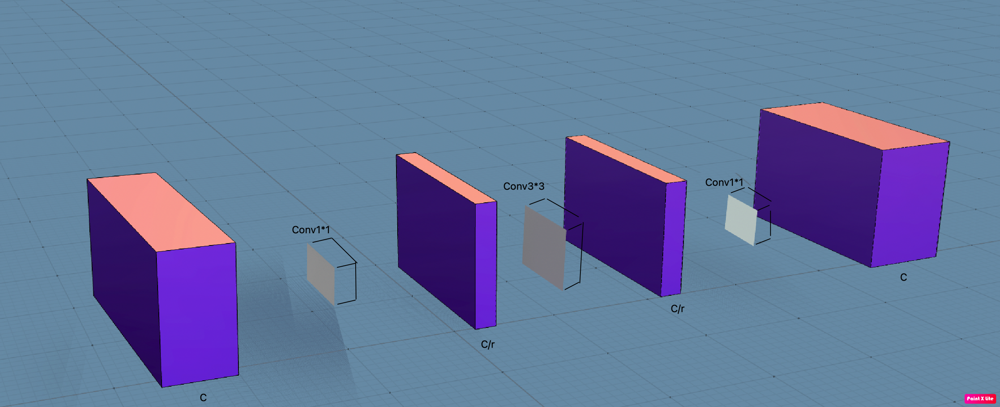

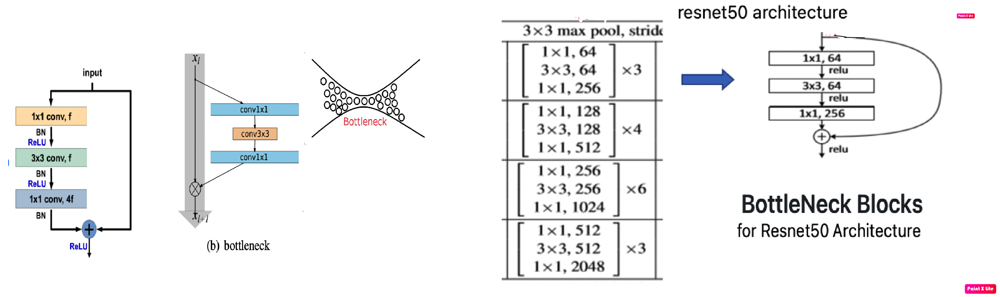

In [4]:
x = torch.randn((1, 32, 56, 56))
x.shape

torch.Size([1, 32, 56, 56])

In [5]:
from functools import partial
class ConvNormAct(nn.Sequential):
    def __init__(
        self,
        in_features: int,
        out_features: int,
        kernel_size: int,
        norm: nn.Module = nn.BatchNorm2d,
        act: nn.Module = nn.ReLU,
        **kwargs
    ):

        super().__init__(
            nn.Conv2d(
                in_features,
                out_features,
                kernel_size=kernel_size,
                padding=kernel_size // 2,
            ),
            norm(out_features),
            act(),
        )


Conv1X1BnReLU = partial(ConvNormAct, kernel_size=1)
Conv3X3BnReLU = partial(ConvNormAct, kernel_size=3)
class ResidualAdd(nn.Module):
    def __init__(self, block: nn.Module, shortcut: Optional[nn.Module] = None):
        super().__init__()
        self.block = block
        self.shortcut = shortcut
        
    def forward(self, x: Tensor) -> Tensor:
        res = x
        x = self.block(x)
        if self.shortcut:
            res = self.shortcut(res)
        x += res
        return x
# class ResidualAdd(nn.Module):
#     def __init__(self, block: nn.Module):
#         super().__init__()
#         self.block = block
        
#     def forward(self, x: Tensor) -> Tensor:
#         res = x
#         x = self.block(x)
#         x += res
#         return x



class BottleNeck(nn.Sequential):
    def __init__(self, in_features: int, out_features: int, reduction: int = 4):
        reduced_features = out_features // reduction
        super().__init__(
            nn.Sequential(
                ResidualAdd(
                    nn.Sequential(
                        # wide -> narrow
                        Conv1X1BnReLU(in_features, reduced_features),
                        # narrow -> narrow
                        Conv3X3BnReLU(reduced_features, reduced_features),
                        # narrow -> wide
                        Conv1X1BnReLU(reduced_features, out_features, act=nn.Identity),
                    ),
                    shortcut=Conv1X1BnReLU(in_features, out_features)
                    if in_features != out_features
                    else None,
                ),
                nn.ReLU(),
            )
        )
BottleNeck(32, 64)(x).shape

torch.Size([1, 64, 56, 56])

In [6]:
# reduced_features = out_features // reduction # ---> 6//4 = 6//6 = 1
# better use reduction 6 but use this example 4 don't different 

Image shape before: torch.Size([3, 224, 224])
Image shape after add dim: torch.Size([1, 3, 224, 224])


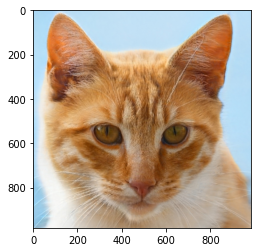

In [8]:
img_BNeck = Image.open(str('/content/sample_data/cat.jpeg'))
plt.imshow(img_BNeck)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0., std=1.)
])
img_BNeck = transform(img_BNeck)
print(f"Image shape before: {img_BNeck.shape}")
img_BNeck = img_BNeck.unsqueeze(0)
print(f"Image shape after add dim: {img_BNeck.shape}")
img_BNeck = img_BNeck.to(device)


In [9]:
bottleneck = BottleNeck(3,6)
bottleneck

BottleNeck(
  (0): Sequential(
    (0): ResidualAdd(
      (block): Sequential(
        (0): ConvNormAct(
          (0): Conv2d(3, 1, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (1): ConvNormAct(
          (0): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (2): ConvNormAct(
          (0): Conv2d(1, 6, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): Identity()
        )
      )
      (shortcut): ConvNormAct(
        (0): Conv2d(3, 6, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
    )
    (1): ReLU()
  )
)

In [10]:
# in_features = 3
# out_features = 6
# reduction = 6 
# reduced_features = out_features // reduction ---> 6//6 = 1
bottleneck.to(device)
bottleneck(img_BNeck).shape


torch.Size([1, 6, 224, 224])

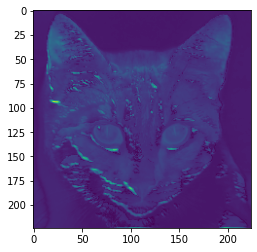

In [11]:
# 
b = bottleneck(img_BNeck)
shortcut_image = b.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/6,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)


In [12]:
bottleneck

BottleNeck(
  (0): Sequential(
    (0): ResidualAdd(
      (block): Sequential(
        (0): ConvNormAct(
          (0): Conv2d(3, 1, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (1): ConvNormAct(
          (0): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (2): ConvNormAct(
          (0): Conv2d(1, 6, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): Identity()
        )
      )
      (shortcut): ConvNormAct(
        (0): Conv2d(3, 6, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
    )
    (1): ReLU()
  )
)

In [13]:
bottleneck
bottleneck[0][0]
b1 = bottleneck[0][0].block[0]
b1


ConvNormAct(
  (0): Conv2d(3, 1, kernel_size=(1, 1), stride=(1, 1))
  (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
)

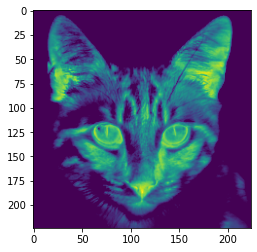

In [14]:
b1 = bottleneck[0][0].block[0](img_BNeck)
shortcut_image = b1.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/1,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)

In [15]:
bottleneck[0][0].block[1]

ConvNormAct(
  (0): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
)

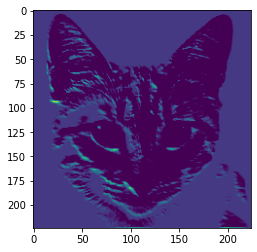

In [16]:
b2 = bottleneck[0][0].block[1](b1)
shortcut_image = b2.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/1,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)

In [17]:
bottleneck[0][0].block[2]

ConvNormAct(
  (0): Conv2d(1, 6, kernel_size=(1, 1), stride=(1, 1))
  (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): Identity()
)

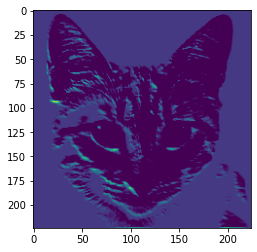

In [18]:
b3 = bottleneck[0][0].block[2](b2)
b3.shape
shortcut_image = b2.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/6,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)

In [19]:
s = bottleneck[0][0].shortcut
s

ConvNormAct(
  (0): Conv2d(3, 6, kernel_size=(1, 1), stride=(1, 1))
  (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
)

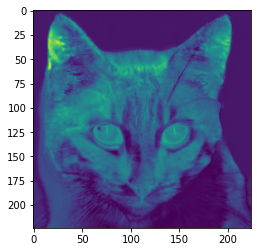

In [20]:
s = bottleneck[0][0].shortcut(img_BNeck)
s
s.shape
shortcut_image = s.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/6,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)

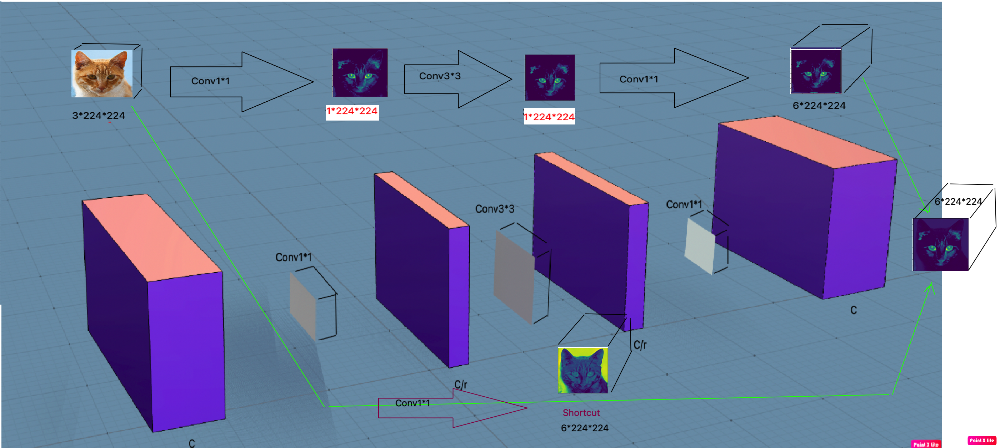

# ***Linear BottleNecks***
A Linear BottleNeck Block is a BottleNeck Block without the last activation. 

In [21]:
from functools import partial
class ConvNormAct(nn.Sequential):
    def __init__(
        self,
        in_features: int,
        out_features: int,
        kernel_size: int,
        norm: nn.Module = nn.BatchNorm2d,
        # act: nn.Module = nn.ReLU,
        **kwargs
    ):

        super().__init__(
            nn.Conv2d(
                in_features,
                out_features,
                kernel_size=kernel_size,
                padding=kernel_size // 2,
            ),
            norm(out_features),
            # act(),
        )


Conv1X1BnReLU = partial(ConvNormAct, kernel_size=1)
Conv3X3BnReLU = partial(ConvNormAct, kernel_size=3)
class ResidualAdd(nn.Module):
    def __init__(self, block: nn.Module, shortcut: Optional[nn.Module] = None):
        super().__init__()
        self.block = block
        self.shortcut = shortcut
        
    def forward(self, x: Tensor) -> Tensor:
        res = x
        x = self.block(x)
        if self.shortcut:
            res = self.shortcut(res)
        x += res
        return x
# class ResidualAdd(nn.Module):
#     def __init__(self, block: nn.Module):
#         super().__init__()
#         self.block = block
        
#     def forward(self, x: Tensor) -> Tensor:
#         res = x
#         x = self.block(x)
#         x += res
#         return x



class BottleNeck_liner(nn.Sequential):
    def __init__(self, in_features: int, out_features: int, reduction: int = 4):
        reduced_features = out_features // reduction
        super().__init__(
            nn.Sequential(
                ResidualAdd(
                    nn.Sequential(
                        # wide -> narrow
                        Conv1X1BnReLU(in_features, reduced_features),
                        # narrow -> narrow
                        Conv3X3BnReLU(reduced_features, reduced_features),
                        # narrow -> wide
                        Conv1X1BnReLU(reduced_features, out_features, act=nn.Identity),
                    ),
                    shortcut=Conv1X1BnReLU(in_features, out_features)
                    if in_features != out_features
                    else None,
                )
              
            )
        )
            
        
BottleNeck_liner(32, 64)(x).shape

torch.Size([1, 64, 56, 56])

Image shape before: torch.Size([3, 224, 224])
Image shape after add dim: torch.Size([1, 3, 224, 224])


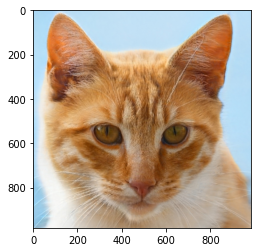

In [22]:
img_BNeck_liner = Image.open(str('/content/sample_data/cat.jpeg'))
plt.imshow(img_BNeck_liner)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0., std=1.)
])
img_BNeck_liner = transform(img_BNeck_liner)
print(f"Image shape before: {img_BNeck_liner.shape}")
img_BNeck_liner = img_BNeck_liner.unsqueeze(0)
print(f"Image shape after add dim: {img_BNeck_liner.shape}")
img_BNeck_liner = img_BNeck_liner.to(device)

In [23]:
bottleneck_liner = BottleNeck_liner(3,6)
bottleneck_liner

BottleNeck_liner(
  (0): Sequential(
    (0): ResidualAdd(
      (block): Sequential(
        (0): ConvNormAct(
          (0): Conv2d(3, 1, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): ConvNormAct(
          (0): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (2): ConvNormAct(
          (0): Conv2d(1, 6, kernel_size=(1, 1), stride=(1, 1))
          (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (shortcut): ConvNormAct(
        (0): Conv2d(3, 6, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
  )
)

In [24]:
bottleneck_liner.to(device)
bottleneck_liner(img_BNeck).shape


torch.Size([1, 6, 224, 224])

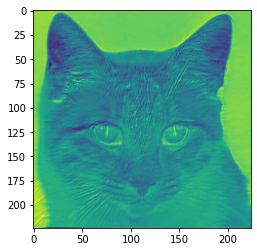

In [25]:
b = bottleneck_liner(img_BNeck)
shortcut_image = b.squeeze(0)
shortcut_image.shape 
shortcut_image  = torch.sum(shortcut_image/6,0)# decrease by sum dim
shortcut_image  = shortcut_image.data.cpu().numpy()
shortcut_image.shape #---> (224, 224)
plt.imshow(shortcut_image)

# You can well see the difference between the final output images in the  **BottleNeck & Linear BottleNecks**

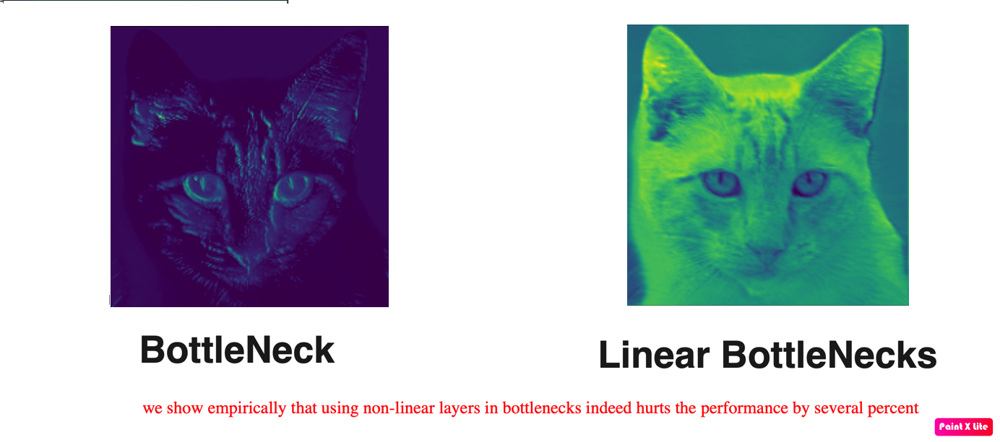